# Evaluate MQA performance

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
pd.options.display.float_format = '{:.3f}'.format
plt.rcParams["figure.dpi"] = 150
sns.set(style='darkgrid')
from IPython.display import display
import warnings
warnings.simplefilter('ignore', UserWarning)
from pathlib import Path
from sklearn.metrics import mean_absolute_error
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams["font.size"] = 15
plt.rcParams['figure.figsize'] = (6, 4)

In [2]:
data_dir = Path('../../../../../data/')
dataset_dir = data_dir / 'out' / 'dataset'
subset_name = 'target_subset_' + Path('.').resolve().parent.name
score_dir = dataset_dir / 'score' / 'subsets' / subset_name
assert score_dir.exists()
fig_dir = score_dir / 'fig' / 'MQA'
fig_dir.mkdir(parents=True, exist_ok=True)
target_list = data_dir / 'interim' / f'{subset_name}.csv'
assert target_list.exists()

In [3]:
label_path = score_dir / 'label.csv'
label_df = pd.read_csv(label_path, index_col=0)
target_df = pd.read_csv(target_list, index_col=0)
neff_df = pd.read_csv(score_dir / 'neff.csv', index_col=0)
target_df = pd.merge(target_df, neff_df, left_on='id', right_on='Target').drop('id', axis=1)
label_df = pd.merge(label_df, target_df, on='Target', how='left')
label_df.head()

,Model,TMscore,GDT_TS,GDT_HA,Global_LDDT,Mean_LDDT,pLDDT,pTMscore,Tolerance,ModelName,...,resolution,releasedate,header,sequence,length,num_entry_in_cluster,num_entry_in_cluster_AF2_notInclude,is_similar_AF2,Neff,NumMSA
0,model_1_ptm_seed_0_rec_10_ens_1,0.981,0.980,0.919,0.910,0.901,0.955,0.900,0.032,model_1_ptm,...,1.470,2019-04-17T00:00:00Z,>6an4_A mol:protein length:158 2-amino-4-hydr...,TVAYIAIGSNLASPLEQVNAALKALGDIPESHILTVSSFYRTPPLG...,158,90,5,True,9570,15080
1,model_1_ptm_seed_0_rec_10_ens_8,0.981,0.979,0.916,0.910,0.901,0.956,0.901,0.019,model_1_ptm,...,1.470,2019-04-17T00:00:00Z,>6an4_A mol:protein length:158 2-amino-4-hydr...,TVAYIAIGSNLASPLEQVNAALKALGDIPESHILTVSSFYRTPPLG...,158,90,5,True,9570,15080
2,model_1_ptm_seed_0_rec_1_ens_1,0.981,0.980,0.917,0.909,0.901,0.944,0.895,20.749,model_1_ptm,...,1.470,2019-04-17T00:00:00Z,>6an4_A mol:protein length:158 2-amino-4-hydr...,TVAYIAIGSNLASPLEQVNAALKALGDIPESHILTVSSFYRTPPLG...,158,90,5,True,9570,15080
3,model_1_ptm_seed_0_rec_1_ens_8,0.980,0.979,0.917,0.910,0.901,0.947,0.896,20.749,model_1_ptm,...,1.470,2019-04-17T00:00:00Z,>6an4_A mol:protein length:158 2-amino-4-hydr...,TVAYIAIGSNLASPLEQVNAALKALGDIPESHILTVSSFYRTPPLG...,158,90,5,True,9570,15080
4,model_1_ptm_seed_0_rec_2_ens_1,0.981,0.979,0.919,0.911,0.903,0.948,0.897,0.172,model_1_ptm,...,1.470,2019-04-17T00:00:00Z,>6an4_A mol:protein length:158 2-amino-4-hydr...,TVAYIAIGSNLASPLEQVNAALKALGDIPESHILTVSSFYRTPPLG...,158,90,5,True,9570,15080


In [4]:
for i, csv in enumerate(sorted(score_dir.glob('*.csv'))):
    if csv.stem == 'label' or csv.stem == 'all_score' or csv.stem.startswith('mqa') or csv.stem == 'neff':
        continue
    if i == 0:
        mqa_df = pd.read_csv(csv, index_col=0)
    else:
        mqa_df = pd.merge(mqa_df, pd.read_csv(csv, index_col=0), on=['Model', 'Target'], how='outer')
mqa_df['DOPE'] = - mqa_df['DOPE']
mqa_df['SOAP'] = - mqa_df['SOAP']
mqa_df

,Model,DOPE,SOAP,Target,DeepAccNet,DeepAccNet-Bert,P3CMQA,ProQ2D,ProQRosCenD,ProQRosFAD,ProQ3D,SBROD,VoroCNN
0,model_1_ptm_seed_0_rec_10_ens_1,19389.191,123028.594,6AN4_A,0.994,0.891,0.973,0.821,0.806,0.967,0.895,1.505,0.686
1,model_1_ptm_seed_0_rec_10_ens_8,19369.781,123495.156,6AN4_A,0.995,0.955,0.972,0.823,0.805,0.966,0.894,1.507,0.687
2,model_1_ptm_seed_0_rec_1_ens_1,19393.094,120974.703,6AN4_A,0.990,0.894,0.977,0.822,0.803,0.961,0.891,1.515,0.687
3,model_1_ptm_seed_0_rec_1_ens_8,19425.303,120961.469,6AN4_A,0.993,0.878,0.977,0.828,0.805,0.966,0.892,1.514,0.684
4,model_1_ptm_seed_0_rec_2_ens_1,19332.221,121001.195,6AN4_A,0.989,0.866,0.973,0.816,0.793,0.963,0.888,1.513,0.679
...,...,...,...,...,...,...,...,...,...,...,...,...,...
112595,model_5_seed_1_rec_7_ens_8,37045.281,101688.102,6SU3_X,0.882,0.897,0.496,0.474,0.514,0.852,0.782,1.369,0.631
112596,model_5_seed_1_rec_8_ens_1,37299.383,103715.461,6SU3_X,0.878,0.835,0.483,0.439,0.443,0.838,0.775,1.370,0.630
112597,model_5_seed_1_rec_8_ens_8,37091.703,102201.047,6SU3_X,0.886,0.899,0.489,0.457,0.478,0.844,0.779,1.367,0.630
112598,model_5_seed_1_rec_9_ens_1,37332.918,103479.828,6SU3_X,0.890,0.853,0.493,0.468,0.473,0.849,0.784,1.367,0.632


In [5]:
label_df.columns

Index(['Model', 'TMscore', 'GDT_TS', 'GDT_HA', 'Global_LDDT', 'Mean_LDDT',
       'pLDDT', 'pTMscore', 'Tolerance', 'ModelName', 'Seed', 'Recycle',
       'Ensemble', 'Target', 'Num_diff', 'Num_missing', 'Length', 'resolution',
       'releasedate', 'header', 'sequence', 'length', 'num_entry_in_cluster',
       'num_entry_in_cluster_AF2_notInclude', 'is_similar_AF2', 'Neff',
       'NumMSA'],
      dtype='object')

In [6]:
df = pd.merge(label_df, mqa_df, on=['Target', 'Model'], how='left')
df_output_path = score_dir / 'all_score.csv.gz'
save_df = df.drop(['header', 'sequence'], axis=1)
save_df.to_csv(df_output_path, compression='gzip')
df

,Model,TMscore,GDT_TS,GDT_HA,Global_LDDT,Mean_LDDT,pLDDT,pTMscore,Tolerance,ModelName,...,SOAP,DeepAccNet,DeepAccNet-Bert,P3CMQA,ProQ2D,ProQRosCenD,ProQRosFAD,ProQ3D,SBROD,VoroCNN
0,model_1_ptm_seed_0_rec_10_ens_1,0.981,0.980,0.919,0.910,0.901,0.955,0.900,0.032,model_1_ptm,...,123028.594,0.994,0.891,0.973,0.821,0.806,0.967,0.895,1.505,0.686
1,model_1_ptm_seed_0_rec_10_ens_8,0.981,0.979,0.916,0.910,0.901,0.956,0.901,0.019,model_1_ptm,...,123495.156,0.995,0.955,0.972,0.823,0.805,0.966,0.894,1.507,0.687
2,model_1_ptm_seed_0_rec_1_ens_1,0.981,0.980,0.917,0.909,0.901,0.944,0.895,20.749,model_1_ptm,...,120974.703,0.990,0.894,0.977,0.822,0.803,0.961,0.891,1.515,0.687
3,model_1_ptm_seed_0_rec_1_ens_8,0.980,0.979,0.917,0.910,0.901,0.947,0.896,20.749,model_1_ptm,...,120961.469,0.993,0.878,0.977,0.828,0.805,0.966,0.892,1.514,0.684
4,model_1_ptm_seed_0_rec_2_ens_1,0.981,0.979,0.919,0.911,0.903,0.948,0.897,0.172,model_1_ptm,...,121001.195,0.989,0.866,0.973,0.816,0.793,0.963,0.888,1.513,0.679
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112595,model_5_seed_1_rec_7_ens_8,0.977,0.965,0.865,0.888,0.885,0.920,NaN,0.045,model_5,...,101688.102,0.882,0.897,0.496,0.474,0.514,0.852,0.782,1.369,0.631
112596,model_5_seed_1_rec_8_ens_1,0.980,0.964,0.861,0.894,0.890,0.922,NaN,0.032,model_5,...,103715.461,0.878,0.835,0.483,0.439,0.443,0.838,0.775,1.370,0.630
112597,model_5_seed_1_rec_8_ens_8,0.977,0.965,0.866,0.887,0.884,0.920,NaN,0.089,model_5,...,102201.047,0.886,0.899,0.489,0.457,0.478,0.844,0.779,1.367,0.630
112598,model_5_seed_1_rec_9_ens_1,0.980,0.964,0.861,0.894,0.890,0.922,NaN,0.031,model_5,...,103479.828,0.890,0.853,0.493,0.468,0.473,0.849,0.784,1.367,0.632


In [7]:
import sys
sys.path.append('../../../../mqa')
from eval import eval, stat_test, eval_get_df

In [8]:
mqa_df.columns

Index(['Model', 'DOPE', 'SOAP', 'Target', 'DeepAccNet', 'DeepAccNet-Bert',
       'P3CMQA', 'ProQ2D', 'ProQRosCenD', 'ProQRosFAD', 'ProQ3D', 'SBROD',
       'VoroCNN'],
      dtype='object')

## Evaluate MQA peformance per target

### For GDT_TS

In [9]:
# Against gdtts
mqa_methods = ['DOPE', 'SOAP', 'ProQ3D', 'SBROD', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert']
methods = mqa_methods + ['pLDDT', 'pTMscore']
label = 'GDT_TS'
data = df
result_df = eval(data, methods, label_name=label)
result_df

300


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.151,0.119,1.996,NaN
1,SOAP,0.158,0.134,2.072,NaN
2,ProQ3D,0.066,0.047,2.339,0.157
3,SBROD,0.003,-0.000,2.520,NaN
4,VoroCNN,0.069,0.053,2.307,0.269
5,P3CMQA,0.129,0.103,2.051,0.122
6,DeepAccNet,0.115,0.082,2.024,0.061
7,DeepAccNet-Bert,0.099,0.081,1.890,0.075
8,pLDDT,0.256,0.214,1.678,0.047
9,pTMscore,0.234,0.198,1.808,0.079


In [10]:
methods

['DOPE',
 'SOAP',
 'ProQ3D',
 'SBROD',
 'VoroCNN',
 'P3CMQA',
 'DeepAccNet',
 'DeepAccNet-Bert',
 'pLDDT',
 'pTMscore']

In [11]:
# Against gdtts (For targets whose value difference between max and min is larger than 0.05)
label = 'GDT_TS'
data = df.groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
result_df = eval(data, methods, label_name=label)
result_df

101


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.233,0.177,3.643,NaN
1,SOAP,0.225,0.185,3.992,NaN
2,ProQ3D,0.131,0.084,4.803,0.158
3,SBROD,0.062,0.051,5.060,NaN
4,VoroCNN,0.111,0.083,4.477,0.231
5,P3CMQA,0.193,0.151,3.925,0.139
6,DeepAccNet,0.258,0.181,3.713,0.092
7,DeepAccNet-Bert,0.226,0.182,3.389,0.109
8,pLDDT,0.335,0.253,3.227,0.059
9,pTMscore,0.335,0.256,3.352,0.081


In [12]:
# Against gdtts
mqa_methods = ['DOPE', 'SOAP', 'ProQ3D', 'SBROD', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert']
methods = mqa_methods + ['pLDDT', 'pTMscore']
label = 'GDT_TS'
data = df.groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
result_each_target = eval_get_df(data, methods, label_name=label)
def get_whole_result_from_each_target(result_each_target, columns):
    result_df = result_each_target.groupby('Method').mean().reset_index()
    order_dict = dict(zip(columns, range(len(columns))))
    result_df['order'] = result_df['Method'].apply(lambda x: order_dict[x])
    result_df = result_df.sort_values('order')
    result_df = result_df.set_index('Method')
    result_df = result_df.reset_index().drop('order', axis=1)
    return result_df
result_df = get_whole_result_from_each_target(result_each_target, methods + ['Random selection'])
result_each_target = pd.merge(result_each_target, target_df, on='Target', how='left')
result_each_target.to_csv(score_dir / 'mqa_result_each_target_gdtts_5.csv')
result_df

101


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.233,0.177,3.643,NaN
1,SOAP,0.225,0.185,3.992,NaN
2,ProQ3D,0.131,0.084,4.803,0.158
3,SBROD,0.062,0.051,5.060,NaN
4,VoroCNN,0.111,0.083,4.477,0.231
5,P3CMQA,0.193,0.151,3.925,0.139
6,DeepAccNet,0.258,0.181,3.713,0.092
7,DeepAccNet-Bert,0.226,0.182,3.389,0.109
8,pLDDT,0.335,0.253,3.227,0.059
9,pTMscore,0.335,0.256,3.352,0.081


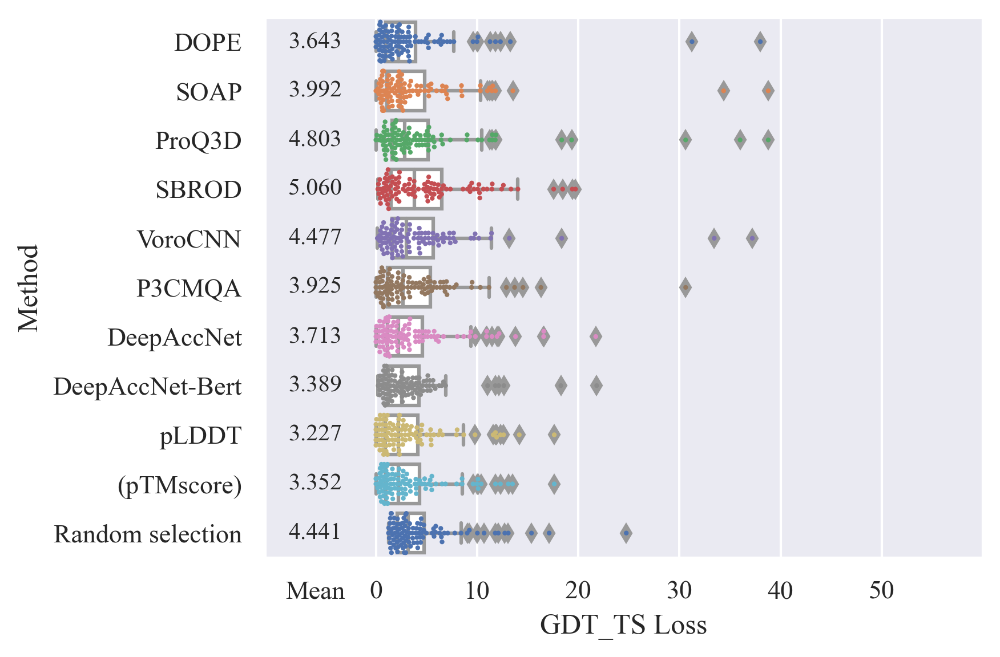

In [13]:
plt.rcParams['font.family'] = 'Times New Roman'
label = 'GDT_TS'
metric = 'Loss'
sns.boxplot(data=result_each_target, x=f'{label} {metric}', y=f'Method', order=methods + ['Random selection'], color='white')
sns.swarmplot(data=result_each_target, x=f'{label} {metric}', y=f'Method', order=methods + ['Random selection'], size=2, palette='deep')
xticks = np.arange(-1, 6) * 10
xticks_start = -6
xticks[0] = xticks_start
xticks_str = xticks.astype(str)
xticks_str[0] = 'Mean'
plt.xlim(-11, 60)
plt.xticks(xticks, xticks_str)
plt.axvline(x=xticks_start, color=(234/255,234/255,242/255))
# put parentheses around the pTMscore
yticks, yticks_texts = plt.yticks()
for i, ytick_text in enumerate(yticks_texts):
    if ytick_text.get_text() == 'pTMscore':
        yticks_texts[i] = '(pTMscore)'
plt.yticks(yticks, yticks_texts)
for i, method in enumerate(methods + ['Random selection']):
    value = result_df.query('Method == @method')[f'{label} {metric}'].values[0]
    plt.text(xticks_start, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
plt.tight_layout()
plt.savefig(fig_dir / f'boxplot_{label}_{metric}.png')
plt.show()

In [14]:
result_each_target.query('Method == "Random selection"')[['Target', 'GDT_TS Loss']].sort_values('GDT_TS Loss')

,Target,GDT_TS Loss
1025,6DHP_u,1.245
1081,6W3G_A,1.259
1088,6XOD_A,1.320
1092,6YA1_A,1.393
1095,6ZPA_A,1.412
...,...,...
1103,7EL1_E,12.744
1015,5Y24_A,13.081
1012,5VTL_A,15.384
1033,6GT9_A,17.124


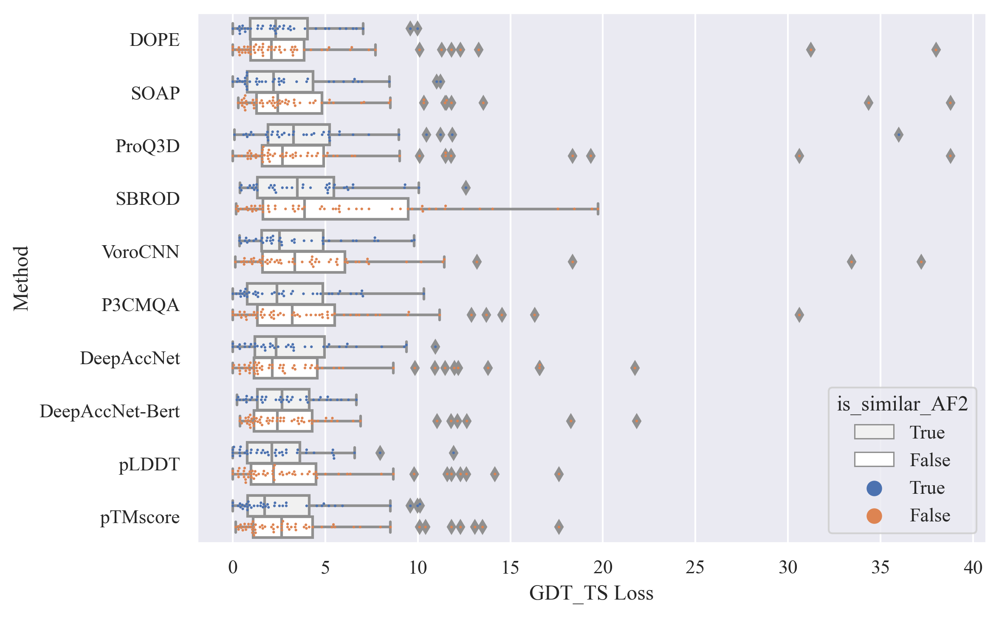

In [15]:
label = 'GDT_TS'
metric = 'Loss'
plt.figure(figsize=(8, 5))
order = [True, False]
sns.boxplot(data=result_each_target, x=f'{label} {metric}', y=f'Method', order=methods, hue='is_similar_AF2', color='white', hue_order=order)
sns.swarmplot(data=result_each_target, x=f'{label} {metric}', y=f'Method', order=methods, size=1.5, hue='is_similar_AF2', dodge=True, hue_order=order)
plt.tight_layout()
plt.savefig(fig_dir / f'boxplot_{label}_{metric}_similar_af2.png')
plt.show()

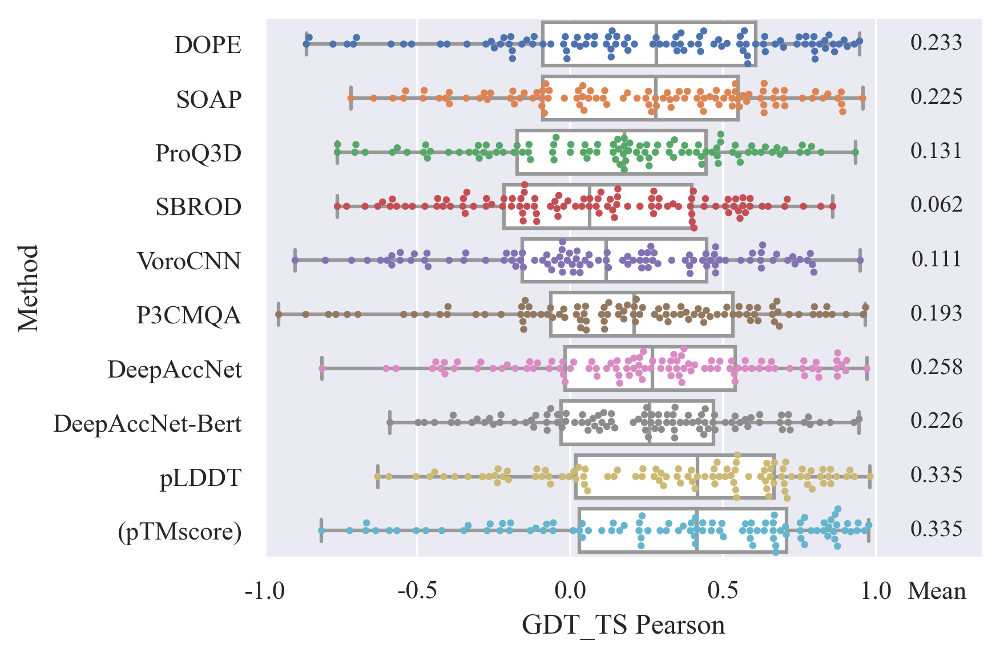

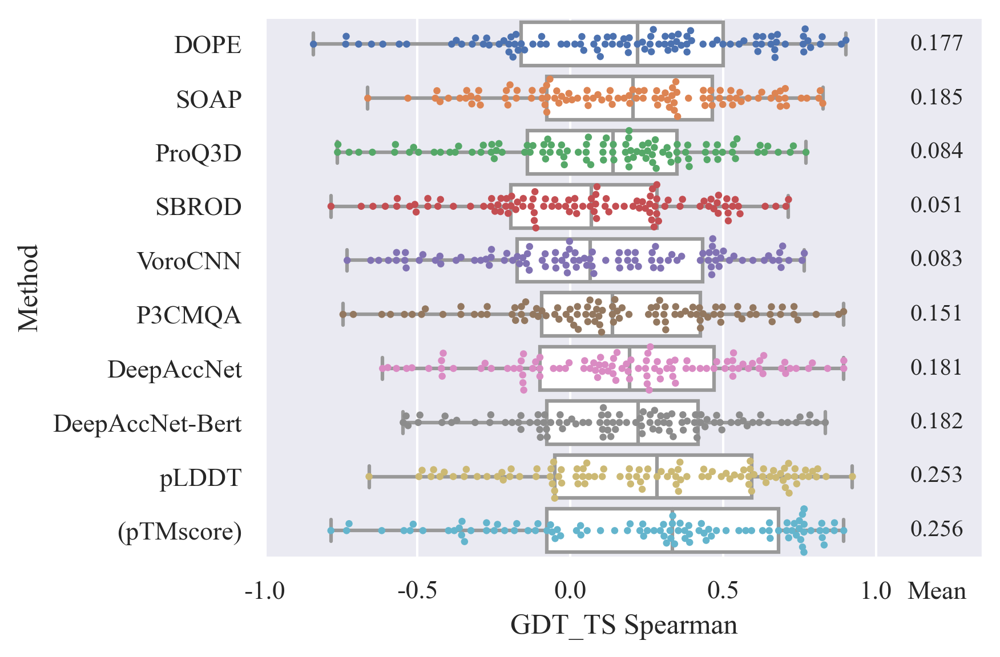

In [16]:
metrics = ['Pearson', 'Spearman']
data = result_each_target
label = 'GDT_TS'
y = 'Method'
for metric in metrics:
    x = f'{label} {metric}'
    sns.boxplot(data=data, x=x, y=y, order=methods, color='white')
    sns.swarmplot(data=data, x=x, y=y, order=methods, size=3)
    xticks_max = 1.2
    plt.xlim(-1, 1.35)
    xticks = np.append(np.arange(-1.0, 1.2, 0.5), [xticks_max])
    xticks_str = list(map(lambda x: f'{x:.1f}', xticks))
    xticks_str[-1] = 'Mean'
    plt.xticks(xticks, xticks_str)
    # put parentheses around the pTMscore
    yticks, yticks_texts = plt.yticks()
    for i, ytick_text in enumerate(yticks_texts):
        if ytick_text.get_text() == 'pTMscore':
            yticks_texts[i] = '(pTMscore)'
    plt.yticks(yticks, yticks_texts)
    plt.axvline(x=xticks_max, color=(234/255,234/255,242/255))
    mean_series = data.groupby(y).mean()[x]
    for i, method in enumerate(methods):
        value = mean_series[method]
        plt.text(xticks_max, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
    plt.tight_layout()
    plt.savefig(fig_dir / f'boxplot_{label}_{metric}.png')
    plt.show()

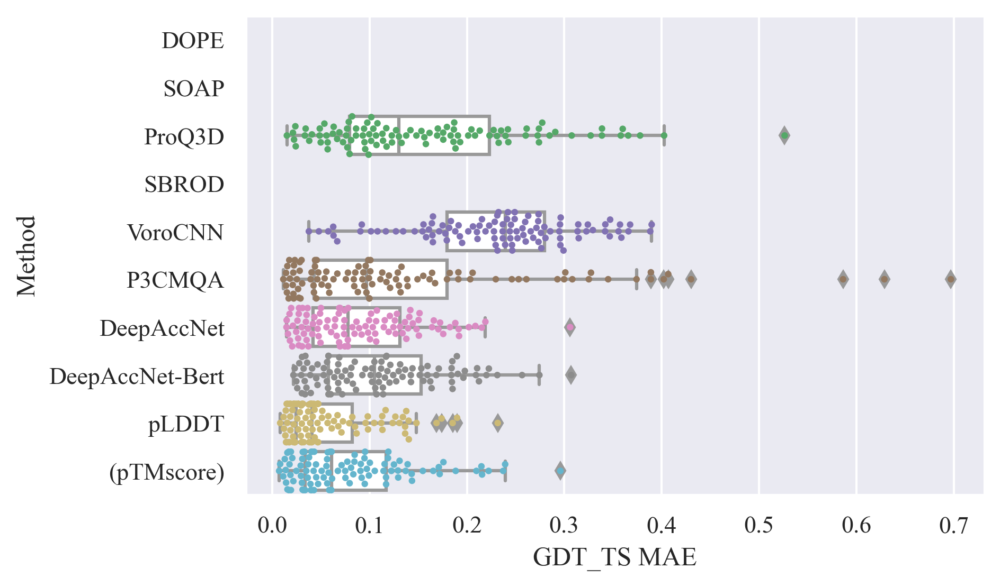

In [17]:
label = 'GDT_TS'
metric = 'MAE'
x = f'{label} {metric}'
sns.boxplot(data=data, x=x, y=y, order=methods, color='white')
sns.swarmplot(data=data, x=x, y=y, order=methods, size=3)
# put parentheses around the pTMscore
yticks, yticks_texts = plt.yticks()
for i, ytick_text in enumerate(yticks_texts):
    if ytick_text.get_text() == 'pTMscore':
        yticks_texts[i] = '(pTMscore)'
plt.yticks(yticks, yticks_texts)
plt.show()

### For models with pTMscore

In [18]:
# Against gdtts (For models by ptm models)
mqa_methods = ['DOPE', 'SOAP', 'ProQ3D', 'SBROD', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert']
methods = mqa_methods + ['pLDDT', 'pTMscore']
label = 'GDT_TS'
data = df[~df['pTMscore'].isna()].groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
result_each_target_ptm = eval_get_df(data, methods, label_name=label)
result_df_ptm = get_whole_result_from_each_target(result_each_target_ptm, methods + ['Random selection'])
result_each_target_ptm = pd.merge(result_each_target_ptm, target_df, on='Target', how='left')
# result_each_target_ptm.to_csv(score_dir / 'mqa_result_each_target_gdtts_5_with_ptm.csv')
result_df_ptm

94


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.263,0.204,3.653,NaN
1,SOAP,0.230,0.189,4.116,NaN
2,ProQ3D,0.118,0.067,5.072,0.160
3,SBROD,0.094,0.088,4.643,NaN
4,VoroCNN,0.134,0.098,4.365,0.230
5,P3CMQA,0.189,0.154,3.936,0.141
6,DeepAccNet,0.261,0.173,3.635,0.094
7,DeepAccNet-Bert,0.251,0.194,3.541,0.113
8,pLDDT,0.345,0.251,3.058,0.062
9,pTMscore,0.335,0.254,3.130,0.081


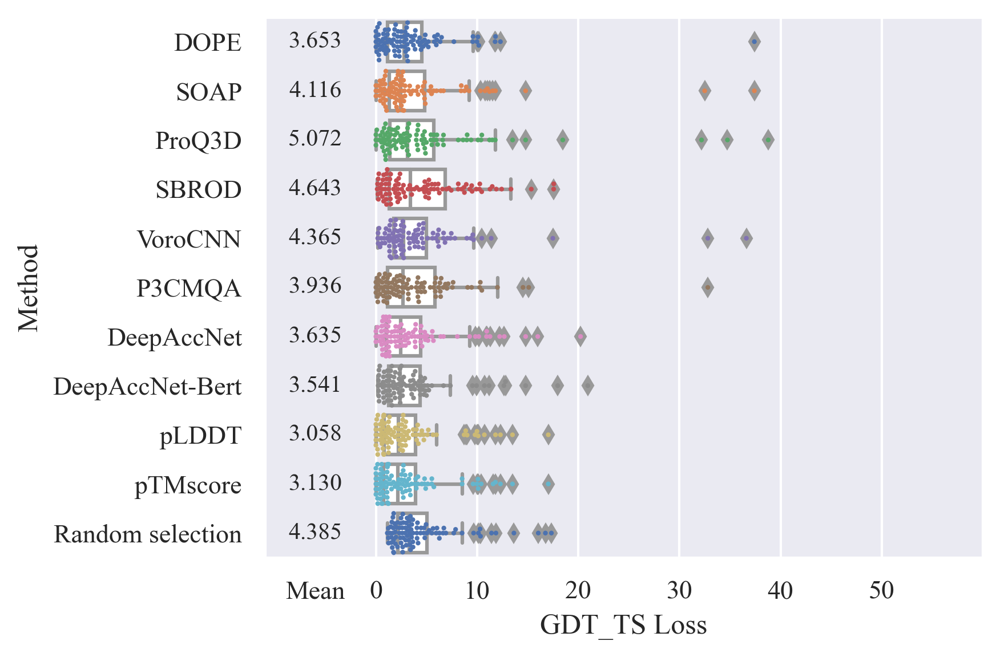

In [19]:
# Against gdtts (For models by ptm models)
label = 'GDT_TS'
metric = 'Loss'
sns.boxplot(data=result_each_target_ptm, x=f'{label} {metric}', y=f'Method', order=methods + ['Random selection'], color='white')
sns.swarmplot(data=result_each_target_ptm, x=f'{label} {metric}', y=f'Method', order=methods + ['Random selection'], size=2, palette='deep')
xticks = np.arange(-1, 6) * 10
xticks_start = -6
xticks[0] = xticks_start
xticks_str = xticks.astype(str)
xticks_str[0] = 'Mean'
plt.xlim(-11, 60)
plt.xticks(xticks, xticks_str)
plt.axvline(x=xticks_start, color=(234/255,234/255,242/255))
for i, method in enumerate(methods + ['Random selection']):
    value = result_df_ptm.query('Method == @method')[f'{label} {metric}'].values[0]
    plt.text(xticks_start, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
plt.tight_layout()
plt.savefig(fig_dir / f'boxplot_{label}_{metric}_with_ptm.png')

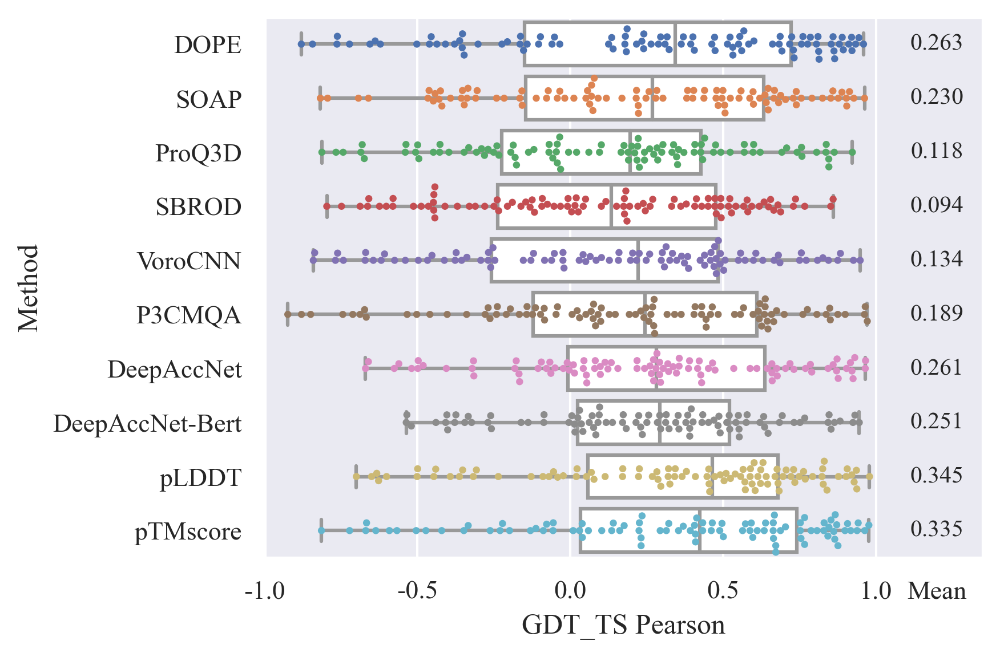

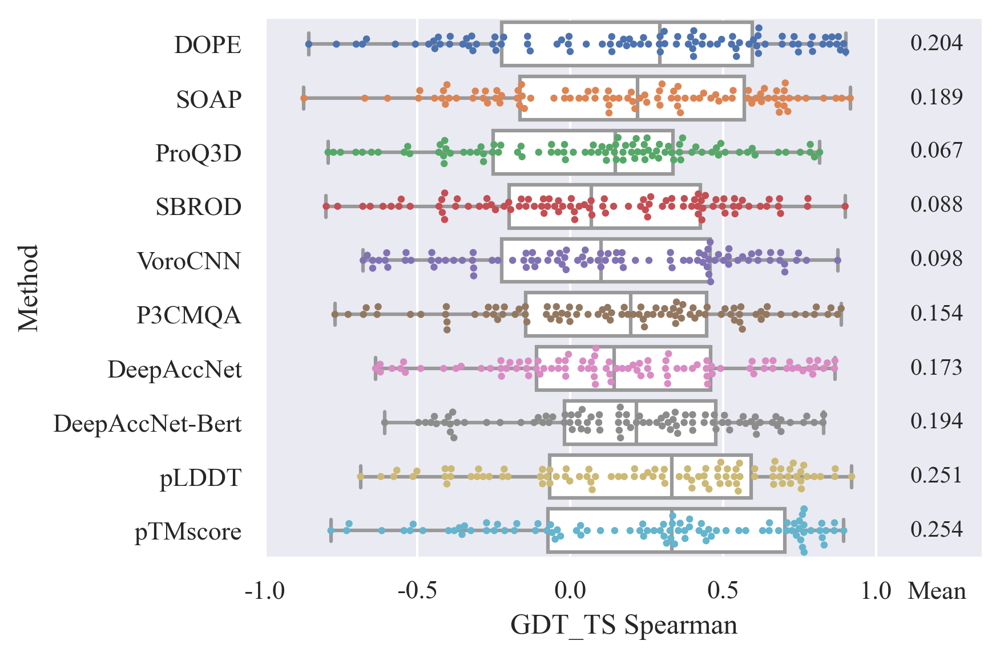

In [20]:
metrics = ['Pearson', 'Spearman']
data = result_each_target_ptm
label = 'GDT_TS'
y = 'Method'
for metric in metrics:
    x = f'{label} {metric}'
    sns.boxplot(data=data, x=x, y=y, order=methods, color='white')
    sns.swarmplot(data=data, x=x, y=y, order=methods, size=3)
    xticks_max = 1.2
    plt.xlim(-1, 1.35)
    xticks = np.append(np.arange(-1.0, 1.2, 0.5), [xticks_max])
    xticks_str = list(map(lambda x: f'{x:.1f}', xticks))
    xticks_str[-1] = 'Mean'
    plt.xticks(xticks, xticks_str)
    plt.axvline(x=xticks_max, color=(234/255,234/255,242/255))
    mean_series = data.groupby(y).mean()[x]
    for i, method in enumerate(methods):
        value = mean_series[method]
        plt.text(xticks_max, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
    plt.tight_layout()
    plt.savefig(fig_dir / f'boxplot_{label}_{metric}_ptm.png')
    plt.show()

In [21]:
# Against gdtts (For models by ptm models)
mqa_methods = ['DOPE', 'SOAP', 'ProQ3D', 'SBROD', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert']
methods = mqa_methods + ['pLDDT', 'pTMscore']
labels = ['GDT_TS', 'Mean_LDDT', 'TMscore', 'GDT_HA']
metrics = ['Pearson', 'Spearman', 'Loss', 'MAE']
result_each_target_ptms = []
for label in labels:
    data = df[~df['pTMscore'].isna()].groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
    result_each_target_ptm = eval_get_df(data, methods, label_name=label)
    result_df_ptm = get_whole_result_from_each_target(result_each_target_ptm, methods + ['Random selection'])
    display(result_df_ptm)
    result_each_target_ptm = result_each_target_ptm.rename(columns={f'{label} {metric}': f'{metric}' for metric in metrics})
    result_each_target_ptm['Label'] = label
    result_each_target_ptms.append(result_each_target_ptm)
result_each_target_ptm_each_label = pd.concat(result_each_target_ptms)
result_each_target_ptm_each_label.to_csv(score_dir / 'mqa_result_each_target_all_label_5_with_ptm.csv')


94


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.263,0.204,3.653,NaN
1,SOAP,0.230,0.189,4.116,NaN
2,ProQ3D,0.118,0.067,5.072,0.160
3,SBROD,0.094,0.088,4.643,NaN
4,VoroCNN,0.134,0.098,4.365,0.230
5,P3CMQA,0.189,0.154,3.936,0.141
6,DeepAccNet,0.261,0.173,3.635,0.094
7,DeepAccNet-Bert,0.251,0.194,3.541,0.113
8,pLDDT,0.345,0.251,3.058,0.062
9,pTMscore,0.335,0.254,3.130,0.081


51


,Method,Mean_LDDT Pearson,Mean_LDDT Spearman,Mean_LDDT Loss,Mean_LDDT MAE
0,DOPE,0.577,0.473,1.846,NaN
1,SOAP,0.488,0.398,2.663,NaN
2,ProQ3D,0.313,0.198,2.824,0.117
3,SBROD,0.145,0.131,3.913,NaN
4,VoroCNN,0.320,0.266,3.041,0.186
5,P3CMQA,0.300,0.240,3.133,0.147
6,DeepAccNet,0.506,0.396,2.058,0.078
7,DeepAccNet-Bert,0.406,0.334,2.716,0.098
8,pLDDT,0.637,0.498,1.540,0.051
9,pTMscore,0.601,0.496,1.525,0.061


51


,Method,TMscore Pearson,TMscore Spearman,TMscore Loss,TMscore MAE
0,DOPE,0.371,0.259,3.996,NaN
1,SOAP,0.342,0.266,4.926,NaN
2,ProQ3D,0.217,0.124,5.945,0.185
3,SBROD,0.172,0.159,4.903,NaN
4,VoroCNN,0.253,0.223,4.392,0.249
5,P3CMQA,0.248,0.195,4.019,0.170
6,DeepAccNet,0.319,0.209,3.504,0.091
7,DeepAccNet-Bert,0.349,0.266,3.687,0.116
8,pLDDT,0.438,0.294,3.145,0.073
9,pTMscore,0.442,0.327,3.289,0.106


182


,Method,GDT_HA Pearson,GDT_HA Spearman,GDT_HA Loss,GDT_HA MAE
0,DOPE,0.178,0.151,4.094,NaN
1,SOAP,0.186,0.165,4.046,NaN
2,ProQ3D,0.084,0.057,4.644,0.099
3,SBROD,0.027,0.023,4.793,NaN
4,VoroCNN,0.076,0.054,4.462,0.155
5,P3CMQA,0.118,0.102,4.175,0.119
6,DeepAccNet,0.160,0.107,3.911,0.140
7,DeepAccNet-Bert,0.134,0.106,3.779,0.137
8,pLDDT,0.313,0.250,3.023,0.114
9,pTMscore,0.265,0.227,3.317,0.084


### MQA performance difference between is_similar_AF2

In [22]:
# Against gdtts
label = 'GDT_TS'
for name, group in df.groupby('is_similar_AF2'):
    print(name)
    data = group
    result_df = eval(data, methods, label_name=label)
    display(result_df)

False
150


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.140,0.102,2.520,NaN
1,SOAP,0.156,0.123,2.626,NaN
2,ProQ3D,0.103,0.066,2.714,0.150
3,SBROD,0.028,0.015,3.180,NaN
4,VoroCNN,0.098,0.075,2.962,0.263
5,P3CMQA,0.121,0.096,2.647,0.172
6,DeepAccNet,0.180,0.138,2.383,0.066
7,DeepAccNet-Bert,0.121,0.100,2.373,0.081
8,pLDDT,0.284,0.221,2.104,0.051
9,pTMscore,0.197,0.143,2.312,0.079


True
150


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.161,0.136,1.473,NaN
1,SOAP,0.160,0.145,1.517,NaN
2,ProQ3D,0.030,0.027,1.963,0.164
3,SBROD,-0.022,-0.016,1.860,NaN
4,VoroCNN,0.040,0.031,1.653,0.276
5,P3CMQA,0.136,0.109,1.455,0.072
6,DeepAccNet,0.049,0.025,1.665,0.056
7,DeepAccNet-Bert,0.077,0.061,1.407,0.070
8,pLDDT,0.229,0.207,1.251,0.044
9,pTMscore,0.271,0.253,1.303,0.078


In [23]:
# Against gdtts (For targets whose value difference between max and min is larger than 0.05)
label = 'GDT_TS'
for name, group in df.groupby('is_similar_AF2'):
    print(name)
    data = group.groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
    result_df = eval(data, methods, label_name=label)
    display(result_df)

False
61


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.292,0.218,4.102,NaN
1,SOAP,0.273,0.215,4.613,NaN
2,ProQ3D,0.225,0.151,4.835,0.145
3,SBROD,0.065,0.038,5.783,NaN
4,VoroCNN,0.146,0.113,5.193,0.227
5,P3CMQA,0.196,0.160,4.541,0.179
6,DeepAccNet,0.309,0.212,4.014,0.094
7,DeepAccNet-Bert,0.266,0.206,3.742,0.111
8,pLDDT,0.401,0.294,3.617,0.061
9,pTMscore,0.376,0.261,3.731,0.086


True
40


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.145,0.113,2.944,NaN
1,SOAP,0.151,0.139,3.045,NaN
2,ProQ3D,-0.011,-0.018,4.756,0.176
3,SBROD,0.058,0.070,3.957,NaN
4,VoroCNN,0.057,0.037,3.385,0.236
5,P3CMQA,0.188,0.137,2.987,0.078
6,DeepAccNet,0.179,0.133,3.254,0.088
7,DeepAccNet-Bert,0.163,0.145,2.850,0.108
8,pLDDT,0.235,0.192,2.632,0.057
9,pTMscore,0.274,0.248,2.774,0.074


In [24]:
# Against mean lddt
label = 'Mean_LDDT'
data = df
result_df = eval(data, methods, label_name=label)
result_df

273


,Method,Mean_LDDT Pearson,Mean_LDDT Spearman,Mean_LDDT Loss,Mean_LDDT MAE
0,DOPE,0.287,0.249,1.163,NaN
1,SOAP,0.261,0.240,1.240,NaN
2,ProQ3D,0.090,0.066,1.411,0.104
3,SBROD,-0.020,-0.033,1.917,NaN
4,VoroCNN,0.099,0.084,1.553,0.213
5,P3CMQA,0.168,0.144,1.370,0.094
6,DeepAccNet,0.161,0.132,1.262,0.078
7,DeepAccNet-Bert,0.159,0.141,1.357,0.081
8,pLDDT,0.365,0.318,0.992,0.047
9,pTMscore,0.349,0.309,1.068,0.042


In [25]:
# Against mean lddt (For targets whose value difference between max and min is larger than 0.05)
label = 'Mean_LDDT'
data = df.groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
result_df = eval(data, methods, label_name=label)
result_df

58


,Method,Mean_LDDT Pearson,Mean_LDDT Spearman,Mean_LDDT Loss,Mean_LDDT MAE
0,DOPE,0.515,0.430,1.971,NaN
1,SOAP,0.453,0.373,2.558,NaN
2,ProQ3D,0.303,0.223,2.613,0.116
3,SBROD,0.126,0.094,4.361,NaN
4,VoroCNN,0.260,0.216,2.972,0.183
5,P3CMQA,0.292,0.233,2.802,0.144
6,DeepAccNet,0.484,0.378,1.824,0.078
7,DeepAccNet-Bert,0.389,0.342,2.317,0.095
8,pLDDT,0.593,0.482,1.656,0.054
9,pTMscore,0.557,0.463,1.759,0.060


In [26]:
# Against mean LDDT
label = 'Mean_LDDT'
for name, group in df.groupby('is_similar_AF2'):
    print(name)
    data = group
    result_df = eval(data, methods, label_name=label)
    display(result_df)

False
132


,Method,Mean_LDDT Pearson,Mean_LDDT Spearman,Mean_LDDT Loss,Mean_LDDT MAE
0,DOPE,0.270,0.224,1.472,NaN
1,SOAP,0.232,0.208,1.532,NaN
2,ProQ3D,0.148,0.109,1.615,0.098
3,SBROD,0.029,0.015,2.213,NaN
4,VoroCNN,0.147,0.120,1.861,0.208
5,P3CMQA,0.132,0.112,1.770,0.129
6,DeepAccNet,0.230,0.195,1.378,0.080
7,DeepAccNet-Bert,0.185,0.165,1.582,0.082
8,pLDDT,0.377,0.316,1.180,0.048
9,pTMscore,0.312,0.265,1.293,0.046


True
141


,Method,Mean_LDDT Pearson,Mean_LDDT Spearman,Mean_LDDT Loss,Mean_LDDT MAE
0,DOPE,0.303,0.272,0.875,NaN
1,SOAP,0.289,0.270,0.967,NaN
2,ProQ3D,0.036,0.027,1.221,0.109
3,SBROD,-0.067,-0.078,1.640,NaN
4,VoroCNN,0.054,0.051,1.264,0.218
5,P3CMQA,0.203,0.174,0.996,0.062
6,DeepAccNet,0.096,0.073,1.153,0.076
7,DeepAccNet-Bert,0.134,0.118,1.146,0.079
8,pLDDT,0.355,0.319,0.817,0.047
9,pTMscore,0.384,0.350,0.858,0.039


### For Mean_LDDT

In [27]:
# Against Mean LDDT
mqa_methods = ['DOPE', 'SOAP', 'ProQ3D', 'SBROD', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert']
methods = mqa_methods + ['pLDDT', 'pTMscore']
label = 'GDT_TS'
data = df.groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
label = 'Mean_LDDT'
result_each_target = eval_get_df(data, methods, label_name=label)
result_df = get_whole_result_from_each_target(result_each_target, methods + ['Random selection'])
result_each_target = pd.merge(result_each_target, target_df, on='Target', how='left')
result_df

90


,Method,Mean_LDDT Pearson,Mean_LDDT Spearman,Mean_LDDT Loss,Mean_LDDT MAE
0,DOPE,0.358,0.293,1.575,NaN
1,SOAP,0.304,0.259,1.870,NaN
2,ProQ3D,0.200,0.144,2.121,0.115
3,SBROD,0.068,0.043,3.230,NaN
4,VoroCNN,0.179,0.145,2.295,0.191
5,P3CMQA,0.240,0.204,2.105,0.115
6,DeepAccNet,0.344,0.277,1.617,0.088
7,DeepAccNet-Bert,0.265,0.231,1.944,0.098
8,pLDDT,0.441,0.370,1.504,0.059
9,pTMscore,0.394,0.334,1.469,0.054


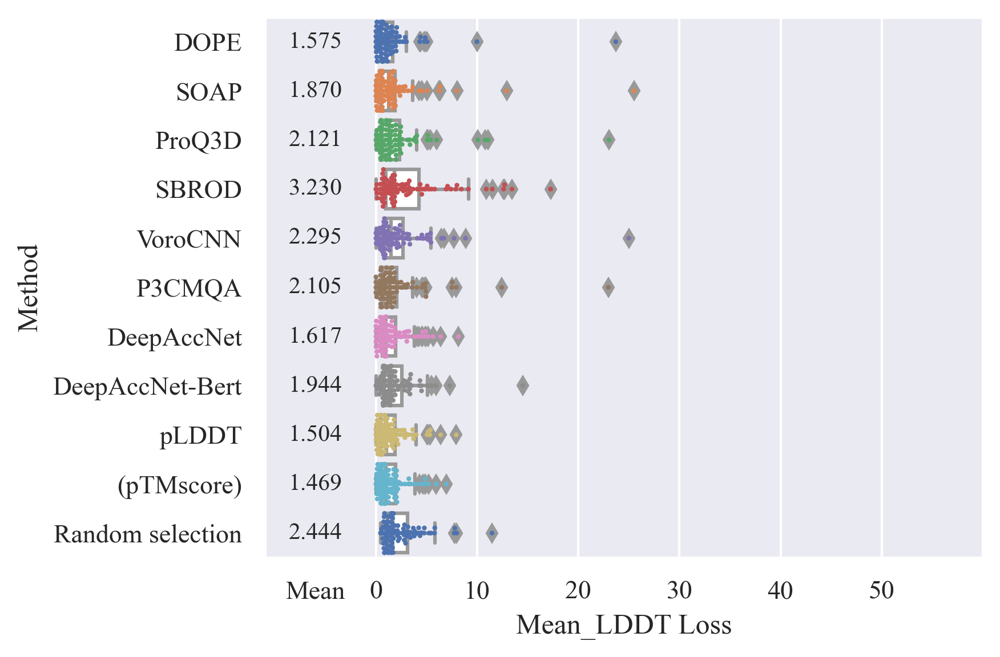

In [28]:
label = 'Mean_LDDT'
metric = 'Loss'
sns.boxplot(data=result_each_target, x=f'{label} {metric}', y=f'Method', order=methods + ['Random selection'], color='white')
sns.swarmplot(data=result_each_target, x=f'{label} {metric}', y=f'Method', order=methods + ['Random selection'], size=2, palette='deep')
xticks = np.arange(-1, 6) * 10
xticks_start = -6
xticks[0] = xticks_start
xticks_str = xticks.astype(str)
xticks_str[0] = 'Mean'
plt.xlim(-11, 60)
plt.xticks(xticks, xticks_str)
plt.axvline(x=xticks_start, color=(234/255,234/255,242/255))
# put parentheses around the pTMscore
yticks, yticks_texts = plt.yticks()
for i, ytick_text in enumerate(yticks_texts):
    if ytick_text.get_text() == 'pTMscore':
        yticks_texts[i] = '(pTMscore)'
plt.yticks(yticks, yticks_texts)
for i, method in enumerate(methods + ['Random selection']):
    value = result_df.query('Method == @method')[f'{label} {metric}'].values[0]
    plt.text(xticks_start, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
plt.tight_layout()
plt.savefig(fig_dir / f'boxplot_{label}_{metric}.png')

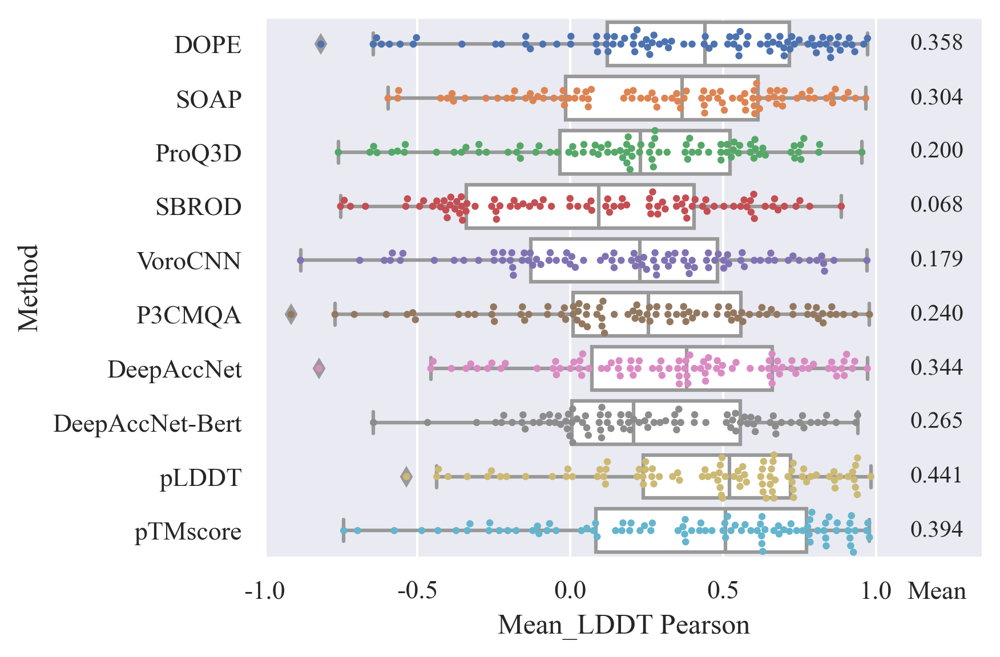

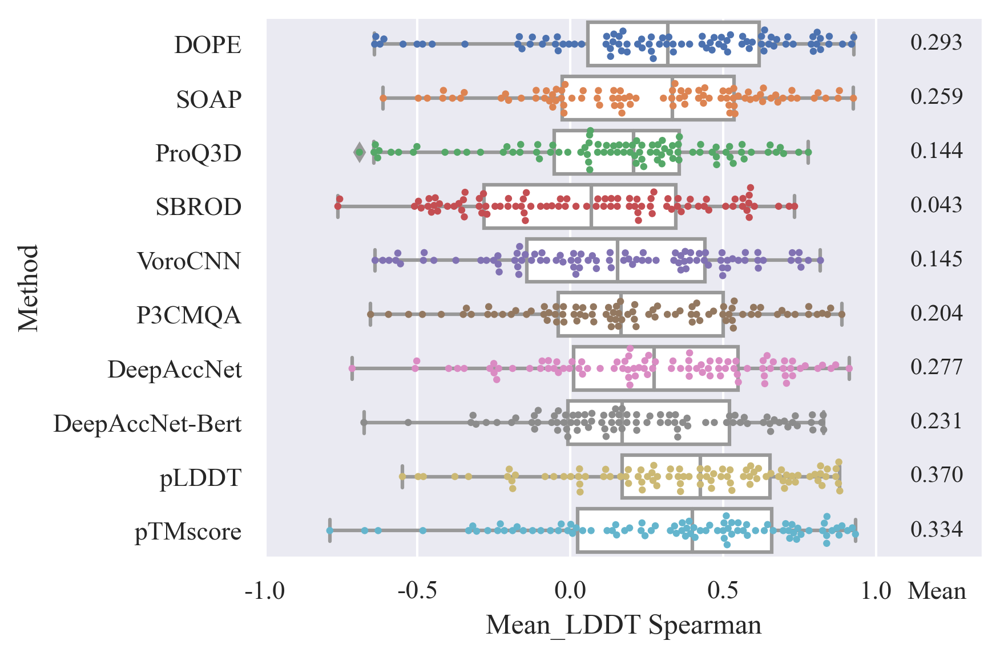

In [29]:
metrics = ['Pearson', 'Spearman']
data = result_each_target
label = 'Mean_LDDT'
y = 'Method'
for metric in metrics:
    x = f'{label} {metric}'
    sns.boxplot(data=data, x=x, y=y, order=methods, color='white')
    sns.swarmplot(data=data, x=x, y=y, order=methods, size=3)
    xticks_max = 1.2
    plt.xlim(-1, 1.35)
    xticks = np.append(np.arange(-1.0, 1.2, 0.5), [xticks_max])
    xticks_str = list(map(lambda x: f'{x:.1f}', xticks))
    xticks_str[-1] = 'Mean'
    plt.xticks(xticks, xticks_str)
    plt.axvline(x=xticks_max, color=(234/255,234/255,242/255))
    mean_series = data.groupby(y).mean()[x]
    for i, method in enumerate(methods):
        value = mean_series[method]
        plt.text(xticks_max, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
    plt.tight_layout()
    plt.savefig(fig_dir / f'boxplot_{label}_{metric}.png')
    plt.show()

### Error between MQA methods and labels

In [30]:
label = 'GDT_TS'
score = 'pLDDT'
error = df[score] - df[label]
error

0        -0.025
1        -0.022
2        -0.037
3        -0.031
4        -0.030
          ...  
112595   -0.045
112596   -0.041
112597   -0.045
112598   -0.042
112599   -0.045
Length: 112600, dtype: float64

/Users/TAKEI/miniforge3/envs/mypython/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

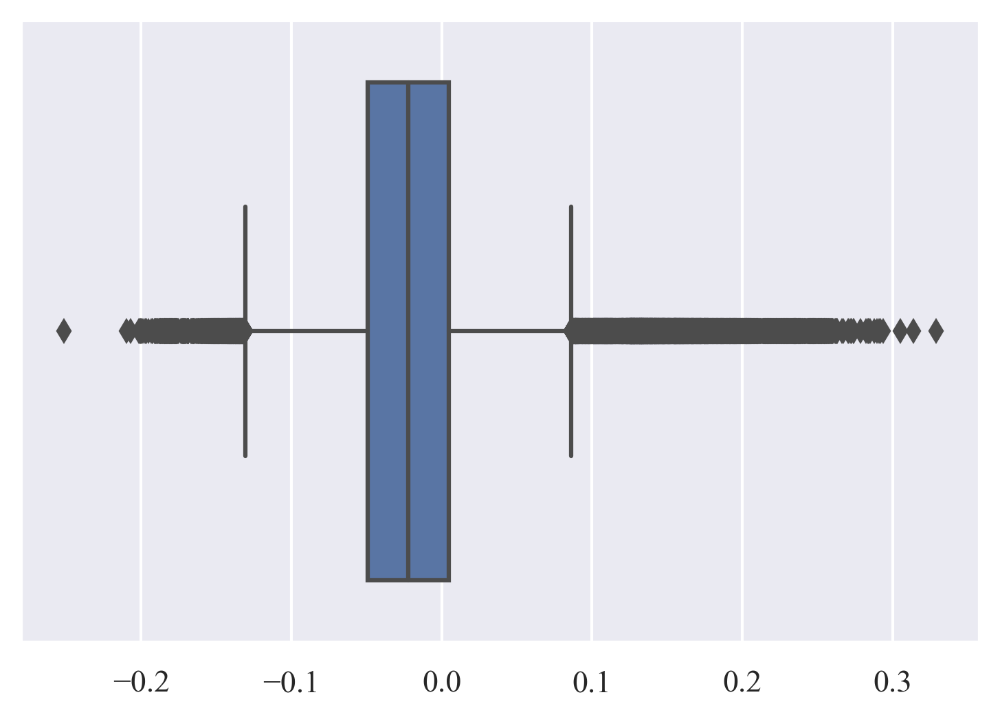

In [31]:
sns.boxplot(error)

## Scatter plot between labels and MQA methods

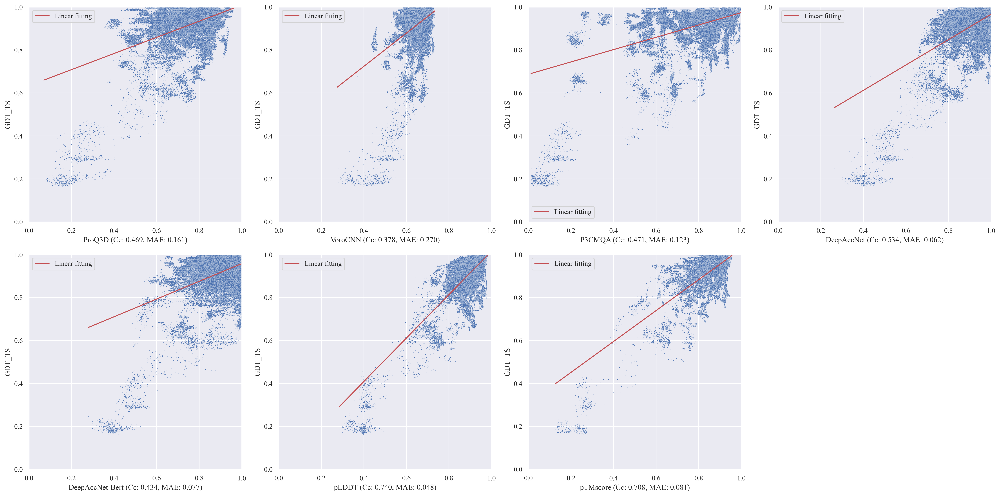

In [32]:
# GDT_TS
nrows = 2
ncols = 4
figsize = (22, 11)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, sharex=False, sharey=False, figsize=figsize)
label = 'GDT_TS'
ms = ['ProQ3D', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert', 'pLDDT', 'pTMscore']
data = df
for i, method in enumerate(ms):
    ax = axes[i // ncols, i % ncols]
    sns.scatterplot(data=data, x=method, y=label, s=1, ax=axes[i // ncols, i % ncols])
    d = data[~data[method].isna()]
    x = d[method]
    y = d[label]
    corr = d.corr()[method][label]
    mae = mean_absolute_error(x, y)
    ax.set_xlabel(f'{method} (Cc: {corr:.3f}, MAE: {mae:.3f})')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    x_latent = np.linspace(x.min(), x.max(), 100)
    a, b = np.polyfit(x, y, 1)
    y_latent = a * x_latent + b
    ax.plot(x_latent, y_latent, 'r-')
    ax.legend(['Linear fitting'])
for i in range(len(ms), ncols * nrows):
    ax = axes[i // ncols, i % ncols]
    ax.axis('off')
plt.tight_layout()
plt.savefig(fig_dir / f'scatterplot_methods_{label}.png')
plt.show()

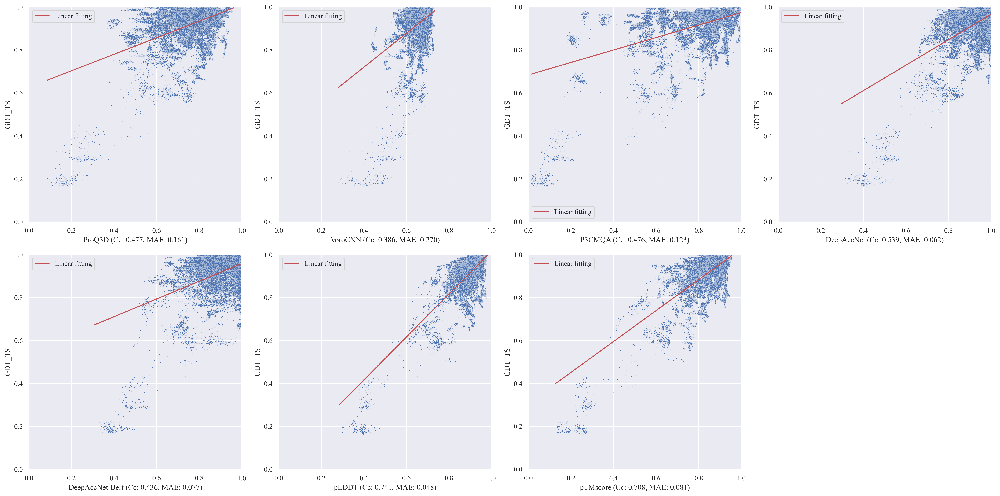

In [33]:
# GDT_TS with pTMscore
nrows = 2
ncols = 4
figsize = (22, 11)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, sharex=False, sharey=False, figsize=figsize)
label = 'GDT_TS'
ms = ['ProQ3D', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert', 'pLDDT', 'pTMscore']
data = df[~df['pTMscore'].isna()]
for i, method in enumerate(ms):
    ax = axes[i // ncols, i % ncols]
    sns.scatterplot(data=data, x=method, y=label, s=1, ax=axes[i // ncols, i % ncols])
    d = data[~data[method].isna()]
    x = d[method]
    y = d[label]
    corr = d.corr()[method][label]
    mae = mean_absolute_error(x, y)
    ax.set_xlabel(f'{method} (Cc: {corr:.3f}, MAE: {mae:.3f})')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    x_latent = np.linspace(x.min(), x.max(), 100)
    a, b = np.polyfit(x, y, 1)
    y_latent = a * x_latent + b
    ax.plot(x_latent, y_latent, 'r-')
    ax.legend(['Linear fitting'])
for i in range(len(ms), ncols * nrows):
    ax = axes[i // ncols, i % ncols]
    ax.axis('off')
plt.tight_layout()
plt.savefig(fig_dir / f'scatterplot_methods_{label}_with_ptm.png')
plt.show()

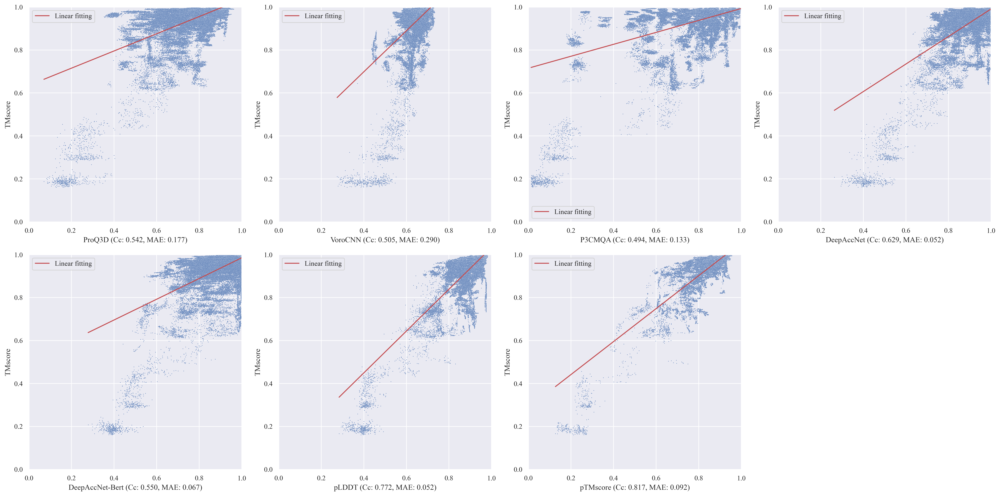

In [34]:
# TMscore
nrows = 2
ncols = 4
figsize = (22, 11)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, sharex=False, sharey=False, figsize=figsize)
label = 'TMscore'
ms = ['ProQ3D', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert', 'pLDDT', 'pTMscore']
data = df
for i, method in enumerate(ms):
    ax = axes[i // ncols, i % ncols]
    sns.scatterplot(data=data, x=method, y=label, s=1, ax=axes[i // ncols, i % ncols])
    d = data[~data[method].isna()]
    x = d[method]
    y = d[label]
    corr = d.corr()[method][label]
    mae = mean_absolute_error(y, x)
    ax.set_xlabel(f'{method} (Cc: {corr:.3f}, MAE: {mae:.3f})')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    x_latent = np.linspace(x.min(), x.max(), 100)
    a, b = np.polyfit(x, y, 1)
    y_latent = a * x_latent + b
    ax.plot(x_latent, y_latent, 'r-')
    ax.legend(['Linear fitting'])
for i in range(len(ms), ncols * nrows):
    ax = axes[i // ncols, i % ncols]
    ax.axis('off')
plt.tight_layout()
plt.savefig(fig_dir / f'scatterplot_methods_{label}.png')
plt.show()

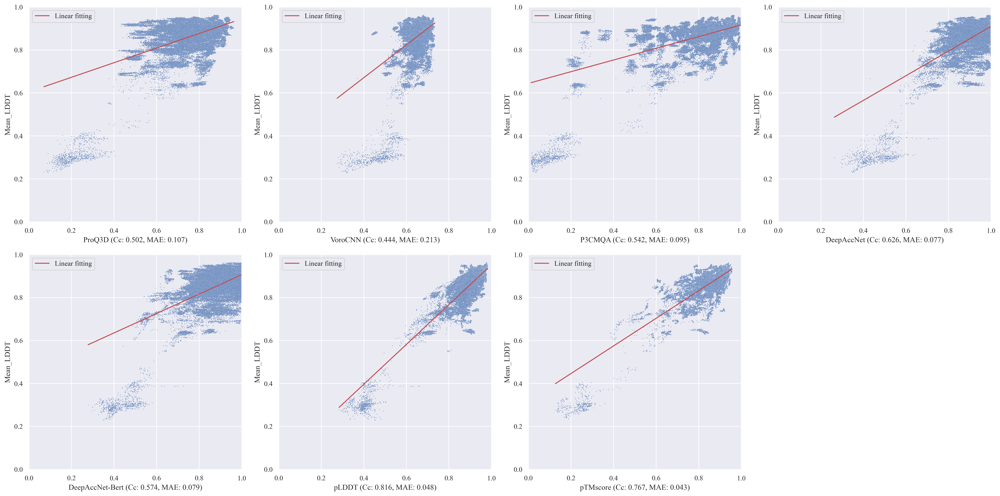

In [35]:
# Mean LDDT
nrows = 2
ncols = 4
figsize = (22, 11)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, sharex=False, sharey=False, figsize=figsize)
label = 'Mean_LDDT'
ms = ['ProQ3D', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert', 'pLDDT', 'pTMscore']
data = df[~df[label].isna()]
for i, method in enumerate(ms):
    ax = axes[i // ncols, i % ncols]
    sns.scatterplot(data=data, x=method, y=label, s=1, ax=axes[i // ncols, i % ncols])
    d = data[~data[method].isna()]
    x = d[method]
    y = d[label]
    corr = d.corr()[method][label]
    mae = mean_absolute_error(x, y)
    ax.set_xlabel(f'{method} (Cc: {corr:.3f}, MAE: {mae:.3f})')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    x_latent = np.linspace(x.min(), x.max(), 100)
    a, b = np.polyfit(x, y, 1)
    y_latent = a * x_latent + b
    ax.plot(x_latent, y_latent, 'r-')
    ax.legend(['Linear fitting'])
for i in range(len(ms), ncols * nrows):
    ax = axes[i // ncols, i % ncols]
    ax.axis('off')
plt.tight_layout()
plt.savefig(fig_dir / f'scatterplot_methods_{label}.png')
plt.show()